In [1]:
import os
os.environ["PYOPENGL_PLATFORM"] = "egl"
os.environ["MPLBACKEND"] = "Agg"  # Disable matplotlib GUI backend

import numpy as np
import matplotlib.pyplot as plt
import trimesh

from fetch_grasp.utils import PROJECT_ROOT
from fetch_grasp.utils.commons import read_rgb_image, read_depth_image, read_mask_image, write_rgb_image, write_pose_to_txt, draw_image_overlay
from fetch_grasp.rendering import OffscreenRenderer
from fetch_grasp.wrappers.foundationpose import FoundationPose, ScorePredictor, PoseRefinePredictor, set_seed, dr

%matplotlib inline

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


Warp 1.3.3 initialized:
   CUDA Toolkit 12.5, Driver 12.4
   Devices:
     "cpu"      : "x86_64"
     "cuda:0"   : "NVIDIA GeForce RTX 4090" (24 GiB, sm_89, mempool enabled)
   Kernel cache:
     /home/my_user/.cache/warp/1.3.3


# Load Input Data for FoundationPose


### Prepare the file paths

- color image
- depth image
- mask image
- camera intrinsics
- object 3D model


In [2]:
save_folder = PROJECT_ROOT / "outputs"

rgb_file = f"{save_folder}/color_image.png"
depth_file = f"{save_folder}/depth_image.png"
mask_file = f"{save_folder}/mask_image.png"
cam_K_file = f"{save_folder}/cam_K.txt"
mesh_file = f"{PROJECT_ROOT}/third-party/SceneReplica/Datasets/benchmarking/models/035_power_drill/textured_simple.obj"

#### Visualize the Segmentation Mask


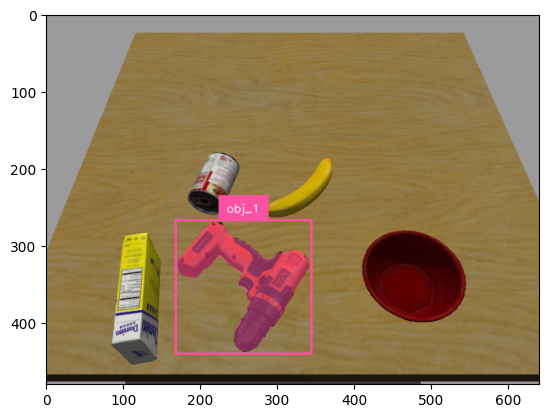

In [3]:
mask_vis = read_rgb_image(save_folder / "mask_image_vis.png")
plt.imshow(mask_vis)

In [4]:
# camera intrinsic and extrinsic parameters
cam_K = np.loadtxt(cam_K_file, dtype=np.float32).reshape((3, 3))
cam_RT = np.eye(4, dtype=np.float32)  # Identity matrix for camera pose

# color, depth, and mask images
color = read_rgb_image(rgb_file)
depth = read_depth_image(depth_file, scale=1000.0)
depth[depth < 0.1] = 0
depth[depth > 2.0] = 0
mask = read_mask_image(mask_file)
im_height = color.shape[0]
im_width = color.shape[1]

# Object mesh
object_mesh = trimesh.load(mesh_file, process=False)

#### Visualize the object mesh


In [5]:
object_mesh.show()

# Initialize the FoundationPose


In [6]:
# Set random seed for reproducibility
set_seed(0)

estimator = FoundationPose(
    model_pts=object_mesh.vertices.astype(np.float32),
    model_normals=object_mesh.vertex_normals.astype(np.float32),
    mesh=object_mesh,
    scorer=ScorePredictor(),
    refiner=PoseRefinePredictor(),
    glctx=dr.RasterizeCudaContext(),
    debug=0,
    debug_dir="debug",
    rotation_grid_min_n_views=120,
    rotation_grid_inplane_step=60,
)

num original candidates = 972
num of pose after clustering: 252


# Estimate the Object 6DoF Pose in Camera Frame


In [7]:
ob_in_cam_mat = estimator.register(
    rgb=color,
    depth=depth,
    ob_mask=mask,
    K=cam_K,
    iteration=15,
)
np.savetxt(save_folder / "ob_in_cam.txt", ob_in_cam_mat, fmt="%.6f")

Module FoundationPose.Utils 64702ec load on device 'cuda:0' took 0.46 ms  (cached)


#### Print the estimated pose


In [8]:
print("Object in camera frame:")
print(ob_in_cam_mat)

Object in camera frame:
[[ 0.49892113  0.86243194 -0.08537573 -0.06712046]
 [-0.6347178   0.43070048  0.6415844   0.13062686]
 [ 0.5900941  -0.26591045  0.76228637  0.6924004 ]
 [ 0.          0.          0.          1.        ]]


# Render Object Pose


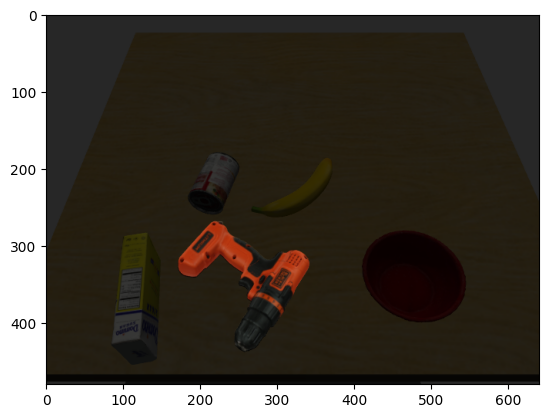

In [9]:
# Initialize the renderer
renderer = OffscreenRenderer(znear=0.1, zfar=100.0)

# Add camera and object mesh to the renderer
renderer.add_camera(cam_K, "camera")
renderer.add_mesh(object_mesh, "object")

# Render color images with the given camera pose and object pose
r_colors = renderer.get_render_colors(
    width=im_width,
    height=im_height,
    cam_names=["camera"],
    cam_poses=[cam_RT],
    mesh_names=["object"],
    mesh_poses=[ob_in_cam_mat],
)

# Draw overlay on the original color image
vis = draw_image_overlay(color, r_colors[0], 0.75)

# Save the visual image
write_rgb_image(save_folder / "ob_in_cam_vis.png", vis)

# Visualize the visual image
plt.imshow(vis)